In [32]:
import tensorflow as tf
import tensorflow_probability as tfp
tfk = tf.keras
tfkl = tf.keras.layers
tfpl = tfp.layers
tfd = tfp.distributions

from tensorflow.keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt
import IPython.display as display
import numpy as np
from statsmodels.distributions.empirical_distribution import ECDF


dataHR = np.load("HR_5_dim.npy")
negative_log_likelihood = lambda x, rv_x: -rv_x.log_prob(x)

## Part 1
The first part of this experiment is to import some data produced in R meant to be from a Hüsler-Reiss copula, to viasualize it and to make sure it passes basic sanity checks.

In R, we generated 10 000 points from a Hüsler-Reiss copula with the following variogram matrix:
$$
 \Gamma = 
 \begin{bmatrix}  
  0.0 & 0.2 & 0.6 & 1.4 & 1.8 \\
  0.2 & 0.0 & 0.4 & 1.2 & 1.6 \\
  0.6 & 0.4 & 0.0 & 1.0 & 1.4 \\
  1.4 & 1.2 & 1.0 & 0.0 & 0.8 \\
  1.8 & 1.6 & 1.4 & 0.8 & 0.0
\end{bmatrix}
$$

We start by plotting all marginals of our multivariate copula to get a sense of what it looks like

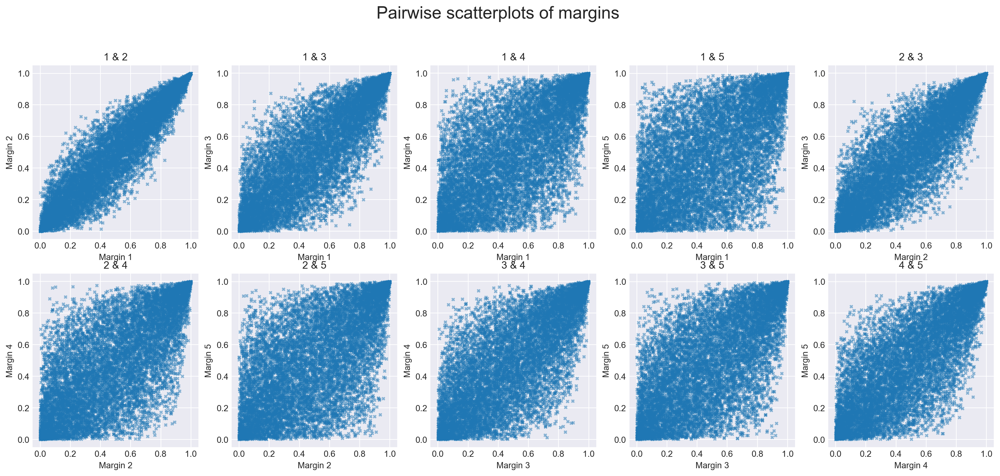

In [33]:
num_rows = 2
num_cols = 5
plt.style.use("seaborn-v0_8-darkgrid")
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)
# order:
# (1-2), (1-3), (1-4), (1-5), (2-3)
# (2-4), (2-5), (3-4), (3-5), (4-5)
axes[0,0].scatter(dataHR[:,0], dataHR[:,1], s=10, marker='x', alpha=0.5)
axes[0,0].set_xlabel("Margin 1")
axes[0,0].set_ylabel("Margin 2")
axes[0,0].set_title("1 & 2")

axes[0,1].scatter(dataHR[:,0], dataHR[:,2], s=10, marker='x', alpha=0.5)
axes[0,1].set_xlabel("Margin 1")
axes[0,1].set_ylabel("Margin 3")
axes[0,1].set_title("1 & 3")

axes[0,2].scatter(dataHR[:,0], dataHR[:,3], s=10, marker='x', alpha=0.5)
axes[0,2].set_xlabel("Margin 1")
axes[0,2].set_ylabel("Margin 4")
axes[0,2].set_title("1 & 4")

axes[0,3].scatter(dataHR[:,0], dataHR[:,4], s=10, marker='x', alpha=0.5)
axes[0,3].set_xlabel("Margin 1")
axes[0,3].set_ylabel("Margin 5")
axes[0,3].set_title("1 & 5")

axes[0,4].scatter(dataHR[:,1], dataHR[:,2], s=10, marker='x', alpha=0.5)
axes[0,4].set_xlabel("Margin 2")
axes[0,4].set_ylabel("Margin 3")
axes[0,4].set_title("2 & 3")


axes[1,0].scatter(dataHR[:,1], dataHR[:,3], s=10, marker='x', alpha=0.5)
axes[1,0].set_xlabel("Margin 2")
axes[1,0].set_ylabel("Margin 4")
axes[1,0].set_title("2 & 4")

axes[1,1].scatter(dataHR[:,1], dataHR[:,4], s=10, marker='x', alpha=0.5)
axes[1,1].set_xlabel("Margin 2")
axes[1,1].set_ylabel("Margin 5")
axes[1,1].set_title("2 & 5")

axes[1,2].scatter(dataHR[:,2], dataHR[:,3], s=10, marker='x', alpha=0.5)
axes[1,2].set_xlabel("Margin 3")
axes[1,2].set_ylabel("Margin 4")
axes[1,2].set_title("3 & 4")

axes[1,3].scatter(dataHR[:,2], dataHR[:,4], s=10, marker='x', alpha=0.5)
axes[1,3].set_xlabel("Margin 3")
axes[1,3].set_ylabel("Margin 5")
axes[1,3].set_title("3 & 5")

axes[1,4].scatter(dataHR[:,3], dataHR[:,4], s=10, marker='x', alpha=0.5)
axes[1,4].set_xlabel("Margin 4")
axes[1,4].set_ylabel("Margin 5")
axes[1,4].set_title("4 & 5")

fig.suptitle("Pairwise scatterplots of margins", fontsize=20, y=1)
plt.show()

We see that the shape of each marginal scatterplot is consistent with the coefficient in the variogram (the closer the coefficient to 0, the greater the dependence and the less dispersion we observe). The overall shape of each plot seems adequate as well.

Text(0.5, 1.05, 'Histogram of each margin')

<Figure size 800x800 with 0 Axes>

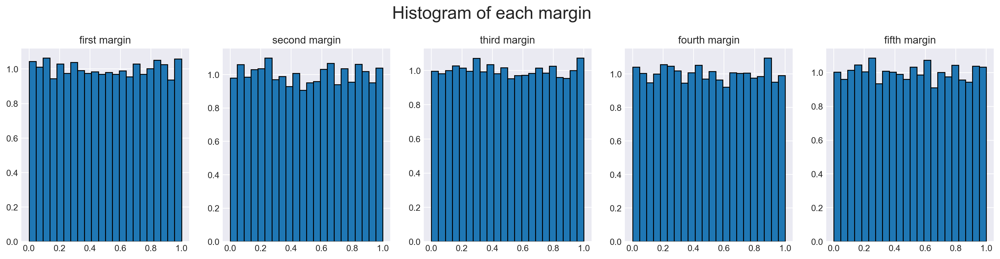

In [36]:
num_rows = 1
num_cols = 5
plt.style.use("seaborn-v0_8-darkgrid")
plt.figure(figsize=(4, 4), dpi=200)
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)
axes[0].hist(dataHR[:,0],bins='auto', edgecolor='black', density=True)
axes[0].set_title("first margin")
axes[1].hist(dataHR[:,1],bins='auto', edgecolor='black', density=True)
axes[1].set_title("second margin")
axes[2].hist(dataHR[:,2],bins='auto', edgecolor='black', density=True)
axes[2].set_title("third margin")
axes[3].hist(dataHR[:,3],bins='auto', edgecolor='black', density=True)
axes[3].set_title("fourth margin")
axes[4].hist(dataHR[:,4],bins='auto', edgecolor='black', density=True)
axes[4].set_title("fifth margin")
fig.suptitle("Histogram of each margin", fontsize=20, y=1.05)

Each margin is about uniform, which is a erquirement of each copula!

Next, we use the GKR test to make sure it doesn't fail. We expect the histogram of each pair of margins to follow a standard Gaussian.

In [37]:
# GKR test implemented:
import numpy as np
from scipy.stats import rankdata, norm

def _gkr_statistic(x, y):
    """
    Internal helper — return S_n^{GKR} only (no variance, no jack-knife).
    """
    n = x.size
    # ranks
    rx = rankdata(x, method="average")
    ry = rankdata(y, method="average")

    # indicator matrix I_{ij}
    I = ((rx[:, None] >= rx[None, :]) &
         (ry[:, None] >= ry[None, :])).astype(np.int8)
    np.fill_diagonal(I, 0)

    # pair & triple terms
    A = I.sum()
    c = I.sum(axis=1)
    B = np.sum(c * (c - 1))

    # statistic
    S = (-1
         + 8.0 * A / (n * (n - 1))
         - 9.0 * B / (n * (n - 1) * (n - 2)))
    return S

def gkr_test(x, y):
    """
    Ghoudi-Khoudraji-Rivest test of extreme-value dependence.
    Returns (stat, z, pvalue).
    """
    x = np.asarray(x)
    y = np.asarray(y)
    if x.shape != y.shape:
        raise ValueError("x and y must have the same length")
    n = x.size
    if n < 3:
        raise ValueError("Need at least 3 observations")

    # 1) raw statistic on the full sample
    S = _gkr_statistic(x, y)

    # 2) variance estimate

    stats_loo = np.empty(n)
    for ell in range(n):
        mask = np.ones(n, dtype=bool)
        mask[ell] = False
        stats_loo[ell] = _gkr_statistic(x[mask], y[mask])
    var_hat = (n - 1) / n * np.sum((stats_loo - S) ** 2)


    # 3) studentised statistic and p-value
    z = S / np.sqrt(var_hat)
    p_two_sided = 2 * (1 - norm.cdf(abs(z)))
    return S, z, p_two_sided

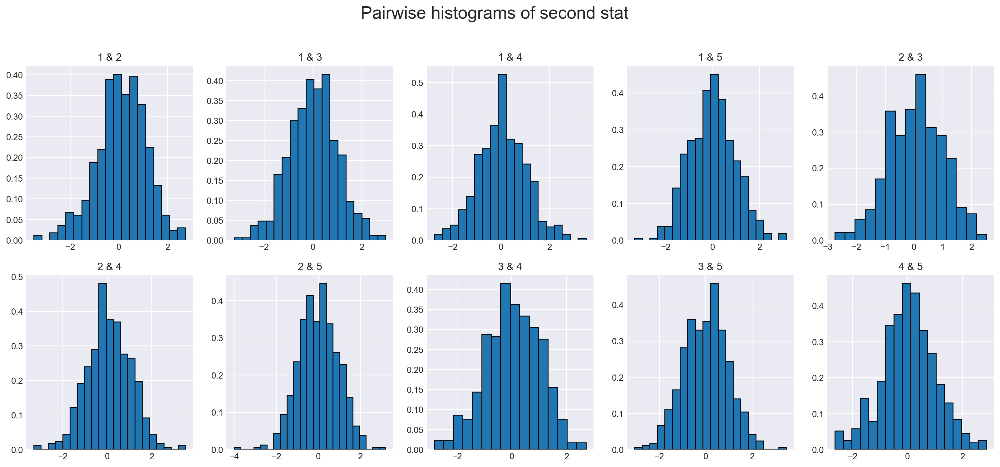

In [38]:
HR_big = np.load("HR_5_dim_big.npy")
pairs = [(0,1), (0,2), (0,3), (0,4), (1,2), (1,3), (1,4), (2,3), (2,4), (3,4)]
samps = []
for pair in pairs:
    stat_samp = []
    for i in range(500):
        test = gkr_test(HR_big[:,pair[0]][i*500:(i+1)*500], HR_big[:,pair[1]][i*500:(i+1)*500])
        stat_samp.append(test[1])
    samps.append(stat_samp)

num_rows = 2
num_cols = 5
plt.style.use("seaborn-v0_8-darkgrid")
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)
# order:
# (1-2), (1-3), (1-4), (1-5), (2-3)
# (2-4), (2-5), (3-4), (3-5), (4-5)
axes[0,0].hist(samps[0], bins='auto', edgecolor='black', density=True)
axes[0,0].set_title("1 & 2")

axes[0,1].hist(samps[1], bins='auto', edgecolor='black', density=True)
axes[0,1].set_title("1 & 3")

axes[0,2].hist(samps[2], bins='auto', edgecolor='black', density=True)
axes[0,2].set_title("1 & 4")

axes[0,3].hist(samps[3], bins='auto', edgecolor='black', density=True)
axes[0,3].set_title("1 & 5")

axes[0,4].hist(samps[4], bins='auto', edgecolor='black', density=True)
axes[0,4].set_title("2 & 3")


axes[1,0].hist(samps[5], bins='auto', edgecolor='black', density=True)
axes[1,0].set_title("2 & 4")

axes[1,1].hist(samps[6], bins='auto', edgecolor='black', density=True)
axes[1,1].set_title("2 & 5")

axes[1,2].hist(samps[7], bins='auto', edgecolor='black', density=True)
axes[1,2].set_title("3 & 4")

axes[1,3].hist(samps[8], bins='auto', edgecolor='black', density=True)
axes[1,3].set_title("3 & 5")

axes[1,4].hist(samps[9], bins='auto', edgecolor='black', density=True)
axes[1,4].set_title("4 & 5")

fig.suptitle("Pairwise histograms of second stat", fontsize=20, y=1)
plt.show()


VAE class:

In [3]:
class Std_Encoder(tfk.Model): #Encodeur
    
    def __init__(self, num_neurons=100, kl_weight=0.1, activation='relu'):      
        super(Std_Encoder,self).__init__()
        self.encoded_size = 20 #taille de l'espace latent
        self.num_neurons = num_neurons
        self.kl_weight = kl_weight
        self.activation = activation
        self.prior        = tfd.MultivariateNormalDiag(loc=tf.zeros(self.encoded_size))
        self.dense1       = tfkl.Dense(self.num_neurons, activation=self.activation)
        self.dense2       = tfkl.Dense(tfpl.IndependentNormal.params_size(self.encoded_size))
        self.ind_norm1    = tfpl.IndependentNormal(self.encoded_size,
                                                   activity_regularizer=tfpl.KLDivergenceRegularizer(self.prior,
                                                                                                     weight=self.kl_weight))
        
    def call(self, inputs):
        x = self.dense1(inputs)
        x = self.dense2(x)
        x = self.ind_norm1(x)
        return x

class Std_Decoder(tfk.Model): #Décodeur
    def __init__(self, num_neurons=100, activation='relu'):
        super(Std_Decoder,self).__init__()
        self.K         = 5 # taille de l'espace de sortie
        self.num_neurons = num_neurons
        self.activation = activation
        self.dense1    = tfkl.Dense(self.num_neurons, use_bias=True, activation=self.activation)
        self.dense2    = tfkl.Dense(tfpl.IndependentNormal(self.K).params_size(self.K))
        self.ind_norm1 = tfpl.IndependentNormal(self.K)
        
        
    def call(self, inputs):
        x = self.dense1(inputs)
        x = self.dense2(x)
        x = self.ind_norm1(x)
        return x

class Std_VAE(tfk.Model):
    def __init__(self, num_neurons_encoder=100, num_neurons_decoder=100, kl_weight=0.1, activation='relu'):      
        super(Std_VAE,self).__init__()
        self.num_neurons_encoder = num_neurons_encoder
        self.num_neurons_decoder = num_neurons_decoder
        self.kl_weight=kl_weight
        self.activation = activation
        self.encoder = Std_Encoder(num_neurons=self.num_neurons_encoder, kl_weight=self.kl_weight, activation = self.activation)
        self.decoder = Std_Decoder(num_neurons=self.num_neurons_decoder, activation = self.activation)
    
    def call(self,inputs):
        return self.decoder(self.encoder(inputs))
    
    # we add this new function to generate new data and apply the copula transform:
    def generate_n_points(self, n):
        prior_points = self.encoder.prior.sample(n)
        gen_pre_transform = self.decoder(prior_points).sample()

        list_of_unifs = []
        for i in range(gen_pre_transform.shape[1]):
            unif = ECDF(np.array(gen_pre_transform[:,i]))(np.array(gen_pre_transform[:,i]))
            unif = unif[:, np.newaxis]
            list_of_unifs.append(unif)

        frame = np.concatenate(tuple(list_of_unifs), axis=1)
        return frame

Now, we attempt to fit the 5-dimensional data using the same specifications as in the 2D case to start. I don't expect great results to begin, but we will tune the parameters progressively

Epoch 1/600
313/313 [==============================] - 5s 3ms/step - loss: 5.3909
Epoch 2/600
313/313 [==============================] - 1s 3ms/step - loss: 2.3579
Epoch 3/600
313/313 [==============================] - 1s 3ms/step - loss: 1.5607
Epoch 4/600
313/313 [==============================] - 1s 3ms/step - loss: 1.3002
Epoch 5/600
313/313 [==============================] - 1s 3ms/step - loss: 1.1527
Epoch 6/600
313/313 [==============================] - 1s 3ms/step - loss: 1.0722
Epoch 7/600
313/313 [==============================] - 1s 3ms/step - loss: 1.0375
Epoch 8/600
313/313 [==============================] - 1s 3ms/step - loss: 0.9964
Epoch 9/600
313/313 [==============================] - 1s 3ms/step - loss: 0.9488
Epoch 10/600
313/313 [==============================] - 1s 3ms/step - loss: 0.9149
Epoch 11/600
313/313 [==============================] - 1s 3ms/step - loss: 0.8822
Epoch 12/600
313/313 [==============================] - 1s 3ms/step - loss: 0.8446
Epoch 13/600


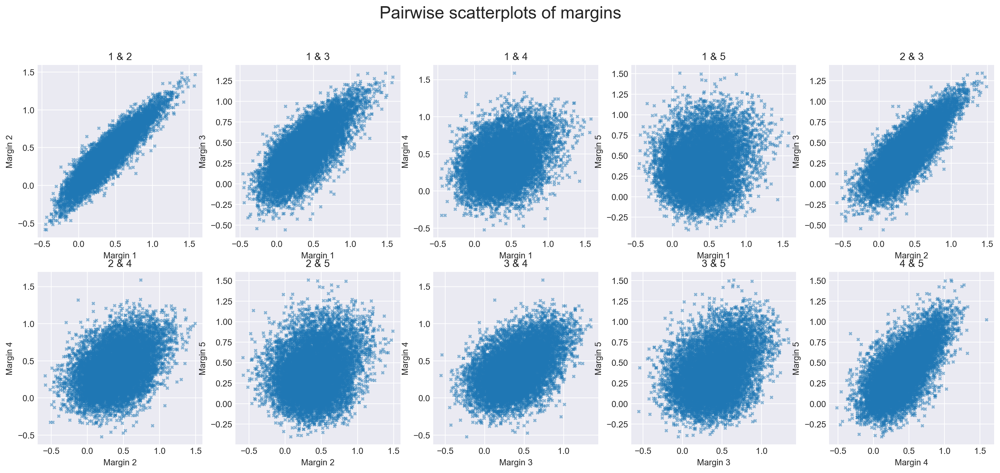

In [8]:
vae = Std_VAE(num_neurons_encoder=40, num_neurons_decoder=40, kl_weight=0.4, activation = 'sigmoid')
vae.compile(optimizer=tf.optimizers.Adam(learning_rate=1e-4),
        loss=negative_log_likelihood)
vae.fit(dataHR, dataHR, batch_size=32, epochs=600)

prior_points = vae.encoder.prior.sample(10000)
sim_frame = vae.decoder(prior_points).sample()

#sim_frame = vae.generate_n_points(10000)

num_rows = 2
num_cols = 5
plt.style.use("seaborn-v0_8-darkgrid")
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)
# order:
# (1-2), (1-3), (1-4), (1-5), (2-3)
# (2-4), (2-5), (3-4), (3-5), (4-5)
axes[0,0].scatter(sim_frame[:,0], sim_frame[:,1], s=10, marker='x', alpha=0.5)
axes[0,0].set_xlabel("Margin 1")
axes[0,0].set_ylabel("Margin 2")
axes[0,0].set_title("1 & 2")

axes[0,1].scatter(sim_frame[:,0], sim_frame[:,2], s=10, marker='x', alpha=0.5)
axes[0,1].set_xlabel("Margin 1")
axes[0,1].set_ylabel("Margin 3")
axes[0,1].set_title("1 & 3")

axes[0,2].scatter(sim_frame[:,0], sim_frame[:,3], s=10, marker='x', alpha=0.5)
axes[0,2].set_xlabel("Margin 1")
axes[0,2].set_ylabel("Margin 4")
axes[0,2].set_title("1 & 4")

axes[0,3].scatter(sim_frame[:,0], sim_frame[:,4], s=10, marker='x', alpha=0.5)
axes[0,3].set_xlabel("Margin 1")
axes[0,3].set_ylabel("Margin 5")
axes[0,3].set_title("1 & 5")

axes[0,4].scatter(sim_frame[:,1], sim_frame[:,2], s=10, marker='x', alpha=0.5)
axes[0,4].set_xlabel("Margin 2")
axes[0,4].set_ylabel("Margin 3")
axes[0,4].set_title("2 & 3")


axes[1,0].scatter(sim_frame[:,1], sim_frame[:,3], s=10, marker='x', alpha=0.5)
axes[1,0].set_xlabel("Margin 2")
axes[1,0].set_ylabel("Margin 4")
axes[1,0].set_title("2 & 4")

axes[1,1].scatter(sim_frame[:,1], sim_frame[:,4], s=10, marker='x', alpha=0.5)
axes[1,1].set_xlabel("Margin 2")
axes[1,1].set_ylabel("Margin 5")
axes[1,1].set_title("2 & 5")

axes[1,2].scatter(sim_frame[:,2], sim_frame[:,3], s=10, marker='x', alpha=0.5)
axes[1,2].set_xlabel("Margin 3")
axes[1,2].set_ylabel("Margin 4")
axes[1,2].set_title("3 & 4")

axes[1,3].scatter(sim_frame[:,2], sim_frame[:,4], s=10, marker='x', alpha=0.5)
axes[1,3].set_xlabel("Margin 3")
axes[1,3].set_ylabel("Margin 5")
axes[1,3].set_title("3 & 5")

axes[1,4].scatter(sim_frame[:,3], sim_frame[:,4], s=10, marker='x', alpha=0.5)
axes[1,4].set_xlabel("Margin 4")
axes[1,4].set_ylabel("Margin 5")
axes[1,4].set_title("4 & 5")

fig.suptitle("Pairwise scatterplots of margins", fontsize=20, y=1)
plt.show()


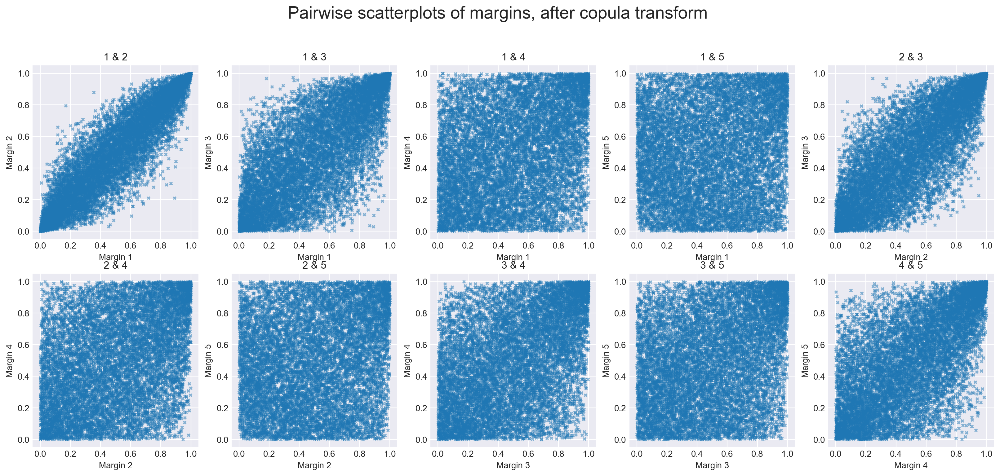

In [9]:
list_of_unifs = []
for i in range(sim_frame.shape[1]):
    unif = ECDF(np.array(sim_frame[:,i]))(np.array(sim_frame[:,i]))
    unif = unif[:, np.newaxis]
    list_of_unifs.append(unif)

sim_frame_unif = np.concatenate(tuple(list_of_unifs), axis=1)

num_rows = 2
num_cols = 5
plt.style.use("seaborn-v0_8-darkgrid")
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)
# order:
# (1-2), (1-3), (1-4), (1-5), (2-3)
# (2-4), (2-5), (3-4), (3-5), (4-5)
axes[0,0].scatter(sim_frame_unif[:,0], sim_frame_unif[:,1], s=10, marker='x', alpha=0.5)
axes[0,0].set_xlabel("Margin 1")
axes[0,0].set_ylabel("Margin 2")
axes[0,0].set_title("1 & 2")

axes[0,1].scatter(sim_frame_unif[:,0], sim_frame_unif[:,2], s=10, marker='x', alpha=0.5)
axes[0,1].set_xlabel("Margin 1")
axes[0,1].set_ylabel("Margin 3")
axes[0,1].set_title("1 & 3")

axes[0,2].scatter(sim_frame_unif[:,0], sim_frame_unif[:,3], s=10, marker='x', alpha=0.5)
axes[0,2].set_xlabel("Margin 1")
axes[0,2].set_ylabel("Margin 4")
axes[0,2].set_title("1 & 4")

axes[0,3].scatter(sim_frame_unif[:,0], sim_frame_unif[:,4], s=10, marker='x', alpha=0.5)
axes[0,3].set_xlabel("Margin 1")
axes[0,3].set_ylabel("Margin 5")
axes[0,3].set_title("1 & 5")

axes[0,4].scatter(sim_frame_unif[:,1], sim_frame_unif[:,2], s=10, marker='x', alpha=0.5)
axes[0,4].set_xlabel("Margin 2")
axes[0,4].set_ylabel("Margin 3")
axes[0,4].set_title("2 & 3")


axes[1,0].scatter(sim_frame_unif[:,1], sim_frame_unif[:,3], s=10, marker='x', alpha=0.5)
axes[1,0].set_xlabel("Margin 2")
axes[1,0].set_ylabel("Margin 4")
axes[1,0].set_title("2 & 4")

axes[1,1].scatter(sim_frame_unif[:,1], sim_frame_unif[:,4], s=10, marker='x', alpha=0.5)
axes[1,1].set_xlabel("Margin 2")
axes[1,1].set_ylabel("Margin 5")
axes[1,1].set_title("2 & 5")

axes[1,2].scatter(sim_frame_unif[:,2], sim_frame_unif[:,3], s=10, marker='x', alpha=0.5)
axes[1,2].set_xlabel("Margin 3")
axes[1,2].set_ylabel("Margin 4")
axes[1,2].set_title("3 & 4")

axes[1,3].scatter(sim_frame_unif[:,2], sim_frame_unif[:,4], s=10, marker='x', alpha=0.5)
axes[1,3].set_xlabel("Margin 3")
axes[1,3].set_ylabel("Margin 5")
axes[1,3].set_title("3 & 5")

axes[1,4].scatter(sim_frame_unif[:,3], sim_frame_unif[:,4], s=10, marker='x', alpha=0.5)
axes[1,4].set_xlabel("Margin 4")
axes[1,4].set_ylabel("Margin 5")
axes[1,4].set_title("4 & 5")

fig.suptitle("Pairwise scatterplots of margins, after copula transform", fontsize=20, y=1)
plt.show()


So was our VAE able to learn at least some of the dependence structure or our multivariate copula? Yes! Let me explain: is $\rho_{ij}$ is the correlation between the $i^{th}$ and the $j^{th}$ margins, then the entry inside the variogram matrix would be $\Gamma_{ij}=2-2\rho_{ij}$. That is, in the variogram, the closer an entry is to 0, the greater the dependence, 0 being perfect dependence as seen in the diagonal of $\Gamma$. Conversely, the closer the entries of the variogram to 2, the less dependence between the two margins.
Now, recall that our variogram is:
$$
 \Gamma = 
 \begin{bmatrix}  
  0.0 & 0.2 & 0.6 & 1.4 & 1.8 \\
  0.2 & 0.0 & 0.4 & 1.2 & 1.6 \\
  0.6 & 0.4 & 0.0 & 1.0 & 1.4 \\
  1.4 & 1.2 & 1.0 & 0.0 & 0.8 \\
  1.8 & 1.6 & 1.4 & 0.8 & 0.0
\end{bmatrix}
$$
This variogram implies that is we were to rank the pairs in order of decreasing dependence, they would be (1-2), (2-3), (1-3), (4-5), (3-4), (2-4), (3-5) tied with (1-4), (2-5), and (1-5). The lowest entry is 0.2 (a strong dependence) and the lowest is 1.8 (almost independence).

This is exactly what our VAE was able to grasp and is reflected in the dispersion of the pairwise scatterplots. The more points tend to be in the center, the greater the dependence and the more uniformly scattered they are, the lesser the dependence. Judging by this, the graphs of our simulated data imply the exact same dependence ranking! (Just for fun without looking at the variogram and just at the graph, the ranking I can infer from the graph is (1-2), (2-3), (1-3), (4-5), (3-4), (2-4), (3-5) tied with (1-4), (2-5), (1-5), I swear I did not cheat). 

Now, we make histograms of the margins

Text(0.5, 0.98, 'Histograms of marginal distributions')

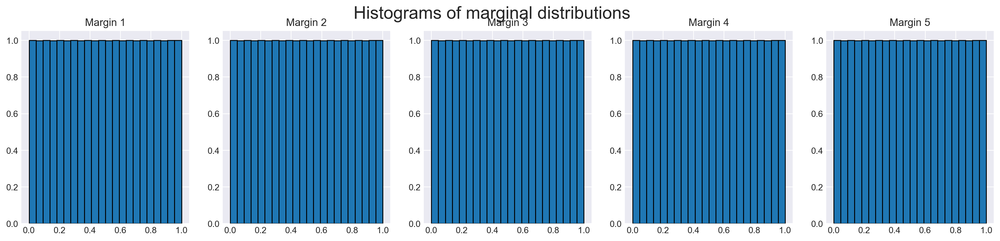

In [10]:
num_rows = 1
num_cols = 5
plt.style.use("seaborn-v0_8-darkgrid")
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)
axes[0].hist(sim_frame_unif[:, 0], bins='auto', edgecolor='black', density=True)
axes[0].set_title("Margin 1")
axes[1].hist(sim_frame_unif[:, 1], bins='auto', edgecolor='black', density=True)
axes[1].set_title("Margin 2")
axes[2].hist(sim_frame_unif[:, 2], bins='auto', edgecolor='black', density=True)
axes[2].set_title("Margin 3")
axes[3].hist(sim_frame_unif[:, 3], bins='auto', edgecolor='black', density=True)
axes[3].set_title("Margin 4")
axes[4].hist(sim_frame_unif[:, 4], bins='auto', edgecolor='black', density=True)
axes[4].set_title("Margin 5")
fig.suptitle("Histograms of marginal distributions", fontsize=20)

And now, we do a pairwise GKR test, similar operation to the operation we did in the 2D case

In [11]:
# GKR test implemented:
import numpy as np
from scipy.stats import rankdata, norm

def _gkr_statistic(x, y):
    """
    Internal helper — return S_n^{GKR} only (no variance, no jack-knife).
    """
    n = x.size
    # ranks
    rx = rankdata(x, method="average")
    ry = rankdata(y, method="average")

    # indicator matrix I_{ij}
    I = ((rx[:, None] >= rx[None, :]) &
         (ry[:, None] >= ry[None, :])).astype(np.int8)
    np.fill_diagonal(I, 0)

    # pair & triple terms
    A = I.sum()
    c = I.sum(axis=1)
    B = np.sum(c * (c - 1))

    # statistic
    S = (-1
         + 8.0 * A / (n * (n - 1))
         - 9.0 * B / (n * (n - 1) * (n - 2)))
    return S

def gkr_test(x, y):
    """
    Ghoudi-Khoudraji-Rivest test of extreme-value dependence.
    Returns (stat, z, pvalue).
    """
    x = np.asarray(x)
    y = np.asarray(y)
    if x.shape != y.shape:
        raise ValueError("x and y must have the same length")
    n = x.size
    if n < 3:
        raise ValueError("Need at least 3 observations")

    # 1) raw statistic on the full sample
    S = _gkr_statistic(x, y)

    # 2) variance estimate

    stats_loo = np.empty(n)
    for ell in range(n):
        mask = np.ones(n, dtype=bool)
        mask[ell] = False
        stats_loo[ell] = _gkr_statistic(x[mask], y[mask])
    var_hat = (n - 1) / n * np.sum((stats_loo - S) ** 2)


    # 3) studentised statistic and p-value
    z = S / np.sqrt(var_hat)
    p_two_sided = 2 * (1 - norm.cdf(abs(z)))
    return S, z, p_two_sided

First, we use it on the original copula data to verify that indeed it satisfies the normality of the second output

In [15]:
HR_big = np.load("HR_5_dim_big.npy")
print(HR_big.shape)

(250000, 5)


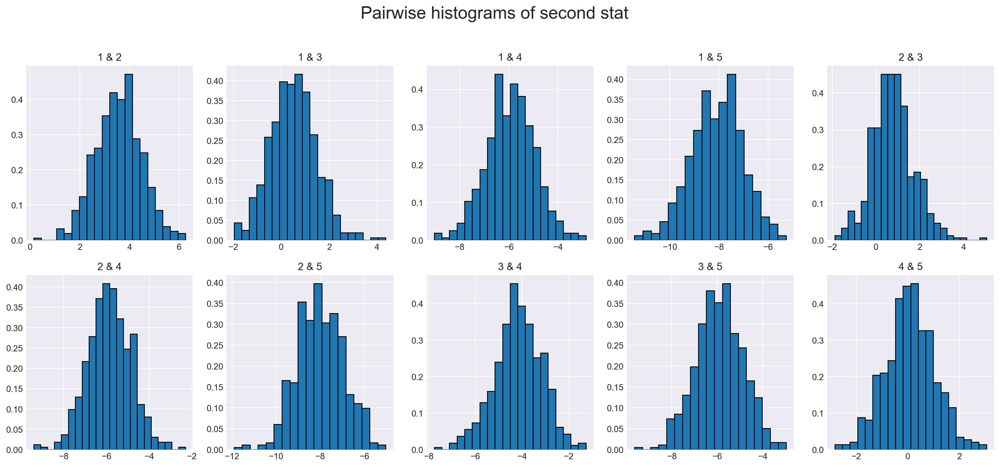

In [16]:
HR_big = np.load("HR_5_dim_big.npy")
pairs = [(0,1), (0,2), (0,3), (0,4), (1,2), (1,3), (1,4), (2,3), (2,4), (3,4)]
samps = []
for pair in pairs:
    stat_samp = []
    for i in range(500):
        test = gkr_test(HR_big[:,pair[0]][i*500:(i+1)*500], HR_big[:,pair[1]][i*500:(i+1)*500])
        stat_samp.append(test[1])
    samps.append(stat_samp)

num_rows = 2
num_cols = 5
plt.style.use("seaborn-v0_8-darkgrid")
fig, axes = plt.subplots(num_rows,num_cols,figsize=(num_cols*4,num_rows*4), dpi=200)
# order:
# (1-2), (1-3), (1-4), (1-5), (2-3)
# (2-4), (2-5), (3-4), (3-5), (4-5)
axes[0,0].hist(samps[0], bins='auto', edgecolor='black', density=True)
axes[0,0].set_title("1 & 2")

axes[0,1].hist(samps[1], bins='auto', edgecolor='black', density=True)
axes[0,1].set_title("1 & 3")

axes[0,2].hist(samps[2], bins='auto', edgecolor='black', density=True)
axes[0,2].set_title("1 & 4")

axes[0,3].hist(samps[3], bins='auto', edgecolor='black', density=True)
axes[0,3].set_title("1 & 5")

axes[0,4].hist(samps[4], bins='auto', edgecolor='black', density=True)
axes[0,4].set_title("2 & 3")


axes[1,0].hist(samps[5], bins='auto', edgecolor='black', density=True)
axes[1,0].set_title("2 & 4")

axes[1,1].hist(samps[6], bins='auto', edgecolor='black', density=True)
axes[1,1].set_title("2 & 5")

axes[1,2].hist(samps[7], bins='auto', edgecolor='black', density=True)
axes[1,2].set_title("3 & 4")

axes[1,3].hist(samps[8], bins='auto', edgecolor='black', density=True)
axes[1,3].set_title("3 & 5")

axes[1,4].hist(samps[9], bins='auto', edgecolor='black', density=True)
axes[1,4].set_title("4 & 5")

fig.suptitle("Pairwise histograms of second stat", fontsize=20, y=1)
plt.show()


VERY SUSPICIOUS^^